In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -qr yolov5/requirements.txt  # install dependencies (ignore errors)
%cd yolov5

import torch
from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.6.0+cu101 _CudaDeviceProperties(name='Tesla V100-SXM2-16GB', major=7, minor=0, total_memory=16130MB, multi_processor_count=80)


# Download Correctly Formatted Custom Dataset 

We'll download our dataset from Roboflow. Use the "**YOLOv5 PyTorch**" export format. Note that the Ultralytics implementation calls for a YAML file defining where your training and test data is. The Roboflow export also writes this format for us.

To get your data into Roboflow, follow the [Getting Started Guide](https://blog.roboflow.ai/getting-started-with-roboflow/).



![YOLOv5 PyTorch export](https://i.imgur.com/5vr9G2u.png)


In [2]:
# Export code snippet and paste here
%cd /content
!curl -L "https://public.roboflow.com/ds/SWlHbPugEZ?key=fTcdor7a9W" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
#rm roboflow.zip




Streaming output truncated to the last 5000 lines.
 extracting: export/labels/1478900208139809310_jpg.rf.aa22f718963fd74816c36362747a2e5f.txt  
 extracting: export/labels/1478897095754019307_jpg.rf.aa1b8183dcaef29a615c9912089c3473.txt  
 extracting: export/labels/1478732017007188764_jpg.rf.a9fa40fbacf90200f65b9f36c6b43131.txt  
 extracting: export/labels/1478900676026204617_jpg.rf.aa1a8e8719bef56f09a0d6dd90f3f3ea.txt  
 extracting: export/labels/1478732798092393026_jpg.rf.aa228f5791738d87d1bacf62531c0cda.txt  
 extracting: export/labels/1478896275952367309_jpg.rf.aa23b59b1d8d54f3a09132da9e8c2a6c.txt  
 extracting: export/labels/1478899778529718267_jpg.rf.aa0d63ee3bcb35c1afed21e6540cdd76.txt  
 extracting: export/labels/1478901473546608423_jpg.rf.aa261619fcf6bfccf9da09aa1b0757fc.txt  
 extracting: export/labels/1478898797054295338_jpg.rf.aa06d409796399ae7edf8356b00c26a5.txt  
 extracting: export/labels/1478897897272970447_jpg.rf.aa398fcc4dbe3f9dd7487082af324c00.txt  
 extracting: export

In [3]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 11
names: ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']

# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [4]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [5]:
#this is the model configuration we will use for our tutorial 
%cat /content/yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-

In [6]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))


In [7]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [9]:
import os
import numpy as np
import random
filenames = [files for files in os.listdir('/content/export/images/')]
random.shuffle(filenames)  # randomly shuffles the ordering of filenames

split_1 = int(0.35 * len(filenames))
split_2 = int(0.1 * len(filenames))
split_3 = int(0.05 * len(filenames))
train_filenames = set(filenames[:split_1])
val_filenames = set(filenames[split_1:split_1+split_2])
test_filenames = set(filenames[split_1+split_2:split_1+split_2+split_3])
print(len(train_filenames))

5250


In [10]:
import shutil
source = '/content/export/images/'
train_dest = '/content/self-driving/train/images'
val_dest = '/content/self-driving/val/images'
test_dest = '/content/self-driving/test/images'
train_count,val_count,test_count = 0,0,0
for file in os.listdir(source):
  if file in train_filenames:
    shutil.move(source+file,train_dest)
    # print(file)
    train_count+=1
  elif file in val_filenames:
    shutil.move(source+file,val_dest)
    val_count+=1
  elif file in test_filenames:
    shutil.move(source+file,test_dest)
    test_count+=1

print(train_count,val_count,test_count)

source = '/content/export/labels/'
train_dest = '/content/self-driving/train/labels'
val_dest = '/content/self-driving/val/labels'
test_dest = '/content/self-driving/test/labels'
train_count,val_count,test_count = 0,0,0
for file in os.listdir(source):
  filename = file[:-4]+'.jpg'
  if filename in train_filenames:
    shutil.move(source+file,train_dest)
    train_count+=1
  elif filename in val_filenames:
    shutil.move(source+file,val_dest)
    val_count+=1
  elif filename in test_filenames:
    shutil.move(source+file,test_dest)
    test_count+=1

print(train_count,val_count,test_count)


5250 1500 750
5250 1500 750


In [12]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data '/content/data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
Using CUDA device0 _CudaDeviceProperties(name='Tesla V100-SXM2-16GB', total_memory=16130MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/custom_yolov5s.yaml', data='/content/data.yaml', device='', epochs=100, evolve=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], local_rank=-1, logdir='runs/', multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, sync_bn=False, total_batch_size=16, weights='', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/", view at http://localhost:6006/
2020-09-01 03:18:56.118487: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Hyperparameters {'lr0': 0.01, 'lrf': 0.2, 'momentum': 0.937, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.5, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, '

# Evaluate Custom YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [13]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

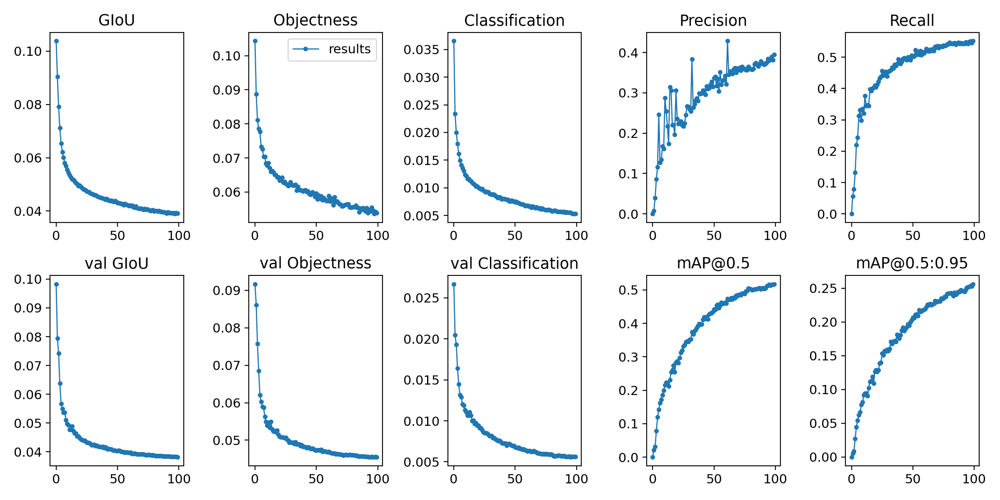

In [15]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
# YOLOv5 doesn't have utils.py file inside utils 
# from utils.utils import plot_results; plot_results()  # plot results.txt as results.png
# Image(filename='./results.png', width=1000)  # view results.png
Image(filename='/content/yolov5/runs/exp1_yolov5s_results/results.png',width=1000)

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

GROUND TRUTH TRAINING DATA:


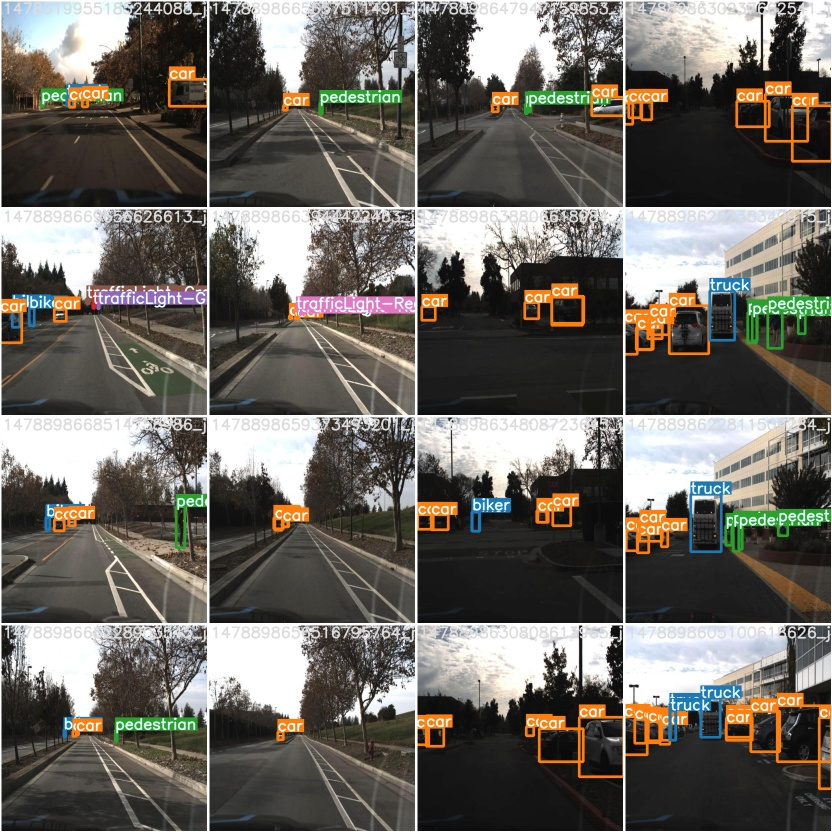

In [16]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/exp1_yolov5s_results/test_batch0_gt.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


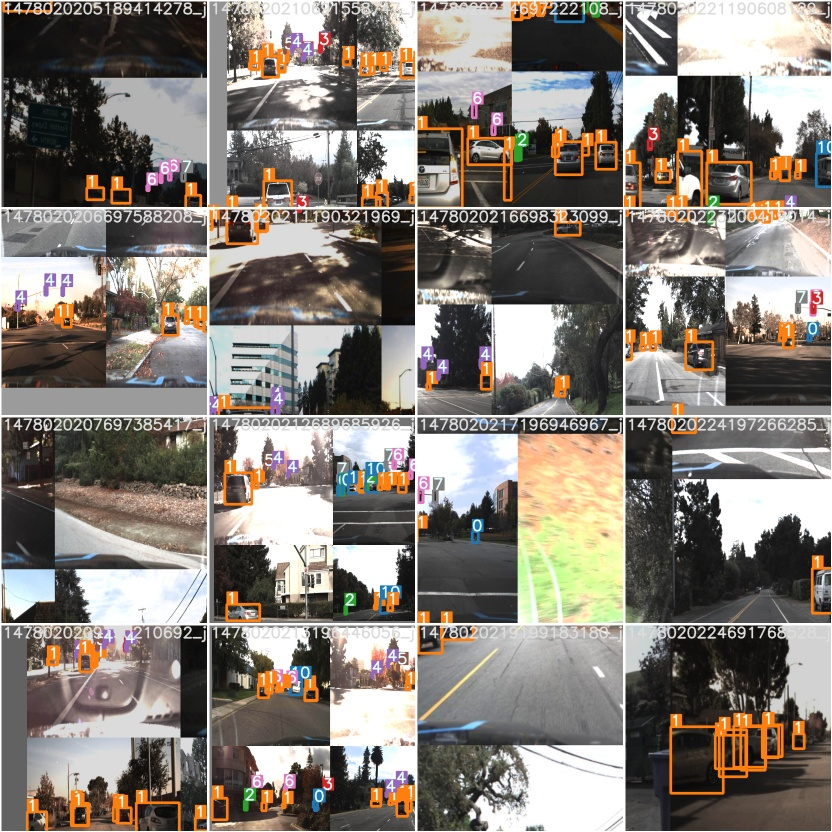

In [18]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/exp1_yolov5s_results/train_batch2.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [19]:
# trained weights are saved by default in our weights folder
%ls runs/

exp0_yolov5s_results/  exp1_yolov5s_results/


In [20]:
%ls runs/exp1_yolov5s_results/weights

best_yolov5s_results.pt  last_yolov5s_results.pt


In [21]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/exp1_yolov5s_results/weights/best_yolov5s_results.pt --img 416 --conf 0.1 --source /content/self-driving/test/images


/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.1, device='', img_size=416, iou_thres=0.5, output='inference/output', save_txt=False, source='/content/self-driving/test/images', update=False, view_img=False, weights=['runs/exp1_yolov5s_results/weights/best_yolov5s_results.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla V100-SXM2-16GB', total_memory=16130MB)

Fusing layers... 
Model Summary: 140 layers, 7.27349e+06 parameters, 6.61683e+06 gradients
image 1/750 /content/self-driving/test/images/1478019959187829768_jpg.rf.c19c3e635f6887a171bb2811d1aaea95.jpg: 416x416 6 cars, 1 trucks, Done. (0.013s)
image 2/750 /content/self-driving/test/images/1478019963682173845_jpg.rf.dc21d918def357245e568cfcb64006ee.jpg: 416x416 9 cars, Done. (0.012s)
image 3/750 /content/self-driving/test/images/1478019978686299906_jpg.rf.9581f1dfab5db75cbd6db63929738432.jpg: 416x416 1 cars, 1 trafficLights, 2 trafficLight-Reds, Done. (0.011s)
image 4/750 /content/se

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
%cp /content/yolov5/runs/exp0_yolov5s_results/weights/last_yolov5s_results.pt /content/gdrive/My\ Drive/Learn/CV/self-driving-car_result.pt

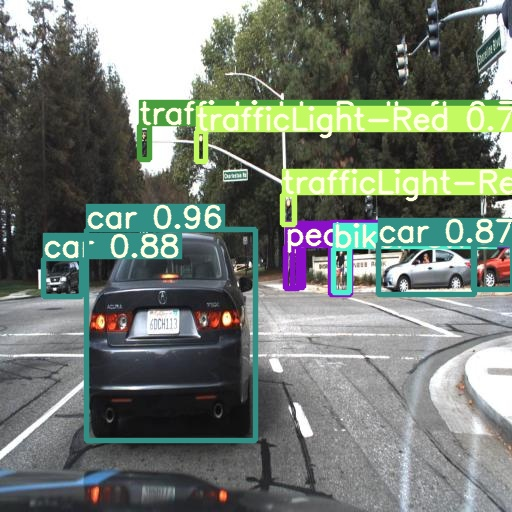

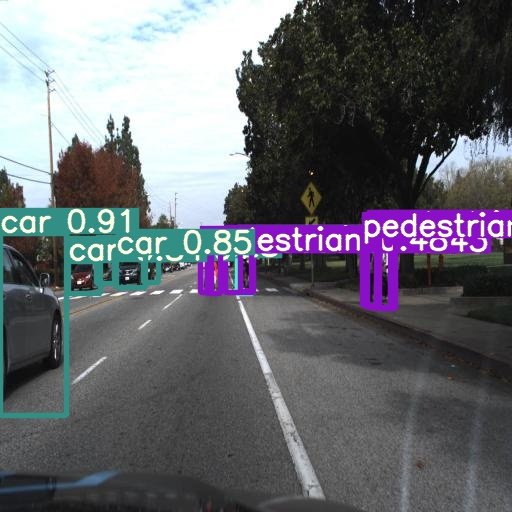

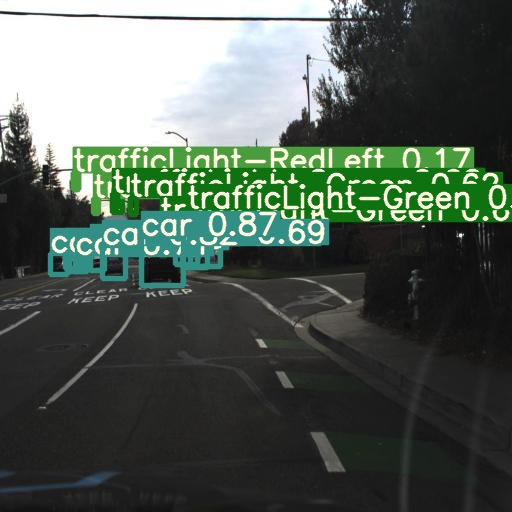

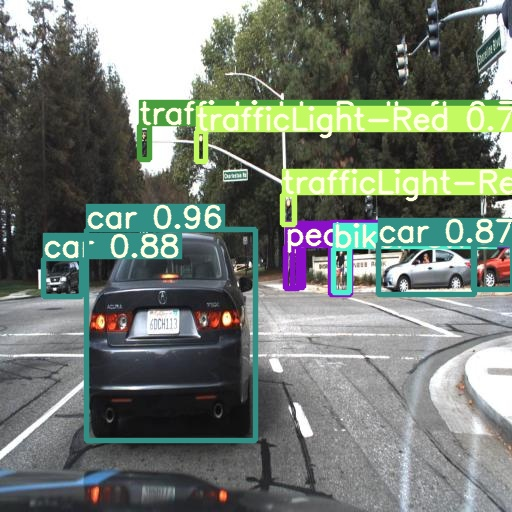

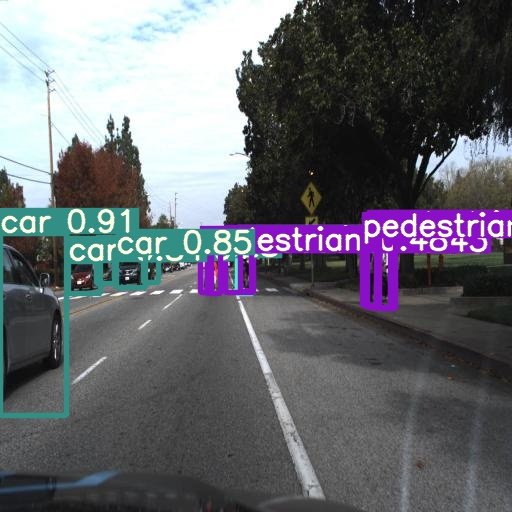

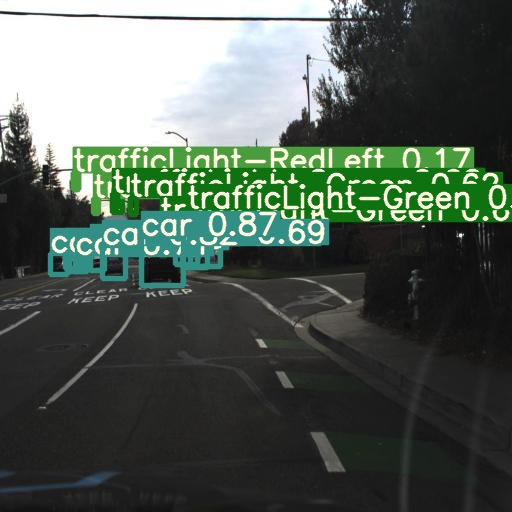

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

count = 0
for imageName in glob.glob('/content/yolov5/inference/output/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")
    if count >10: break